# $\nu_{\tau}$ Investigation in the Dune Collaboration for Advanced Particle Physics Laboratory 2026 - Data Visualization
Author: Grzegorz Jędrzejowski \
Supervision: prof. Katarzyna Grzelak


In [1]:
import os, sys, importlib
import pandas as pd
import matplotlib.pyplot as plt

my_home = '/scratch1/gjedrzej/Lab'
os.chdir(my_home) #GJ path
sys.path.append(os.path.join(os.getcwd(), "python"))

In [ ]:
requirements_path = os.path.join(my_home, 'requirements.txt')

%pip install --upgrade pip #Pip 21.3+ is required
%pip install -r {requirements_path}

#you might need to restart the kernel after installing requirements

In [2]:
import analysis.scripts.convert_full_nodebug as kg
importlib.reload(kg)

import analysis.scripts.convert_skwarek as sk
importlib.reload(sk)

import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

output_dir = 'analysis/processedData'

if not os.path.exists(output_dir):
    os.makedirs(output_dir, exist_ok=True)
    print(f"Created directory: {output_dir}")

/scratch1/gjedrzej/.local/lib/python3.9/site-packages/ROOT/__init__.py:5: UserWarning: 
This distribution of ROOT is in alpha stage. Feedback is welcome and appreciated. Feel free to reach out to the user forum for questions and general feedback at https://root-forum.cern.ch or to submit an issue at https://github.com/root-project/root/issues. Do not rely on this distribution for production purposes.

  warnings.warn(
/scratch1/gjedrzej/.local/lib/python3.9/site-packages/cppyy/__init__.py:374: UserWarning: CPyCppyy API not found (tried: /usr/include/site/python3.9); set CPPYY_API_PATH envar to the 'CPyCppyy' API directory to fix
  warnings.warn("CPyCppyy API not found (tried: %s); "


# File Paths

In [ ]:
FilePath_all = "/scratch1/gjedrzej/Lab/Generators/data/nu_tau_CC_NC_interactions.gtrac.root"
output_path_all = os.path.join(output_dir, 'data_all_tau_val.csv')

FilePath_all_stable = "/scratch1/gjedrzej/Lab/Generators/data/nu_tau_CC_NC_stableTau_interactions.gtrac.root"
output_path_all_stable = os.path.join(output_dir, 'data_all_tau_stable.csv')

# FilePath_NC = 
# FilePath_NC_stable = 

# Prepare CSV files 
Long compilation time, run separately once

In [ ]:
#validation
kg.extract_data(FilePath_all, output_path_all)
kg.extract_data(FilePath_all_stable, output_path_all_stable)

In [3]:
#test
FilePath_test = "/scratch1/gjedrzej/Lab/Generators/data/nu_tau_CC_NC_interactions.gtrac.root"
output_path_test = os.path.join(output_dir, 'data_all_tau_test.csv')
kg.extract_data(FilePath_test, output_path_test)

In [6]:
#train
FilePath_CC_train = "/scratch1/gjedrzej/Lab/Generators/data/nu_tau_CC_interactions.gtrac.root"
output_path_CC_train = os.path.join(output_dir, 'data_CC_train.csv')
kg.extract_data(FilePath_CC_train, output_path_CC_train)


: 

: 

: 

In [ ]:
FilePath_NC_train = "/scratch1/gjedrzej/Lab/Generators/data/nu_tau_NC_interactions.gtrac.root"
output_path_NC_train = os.path.join(output_dir, 'data_NC_train.csv')
kg.extract_data(FilePath_NC_train, output_path_NC_train)

## All Data 0.5-30 GeV Taon Decay

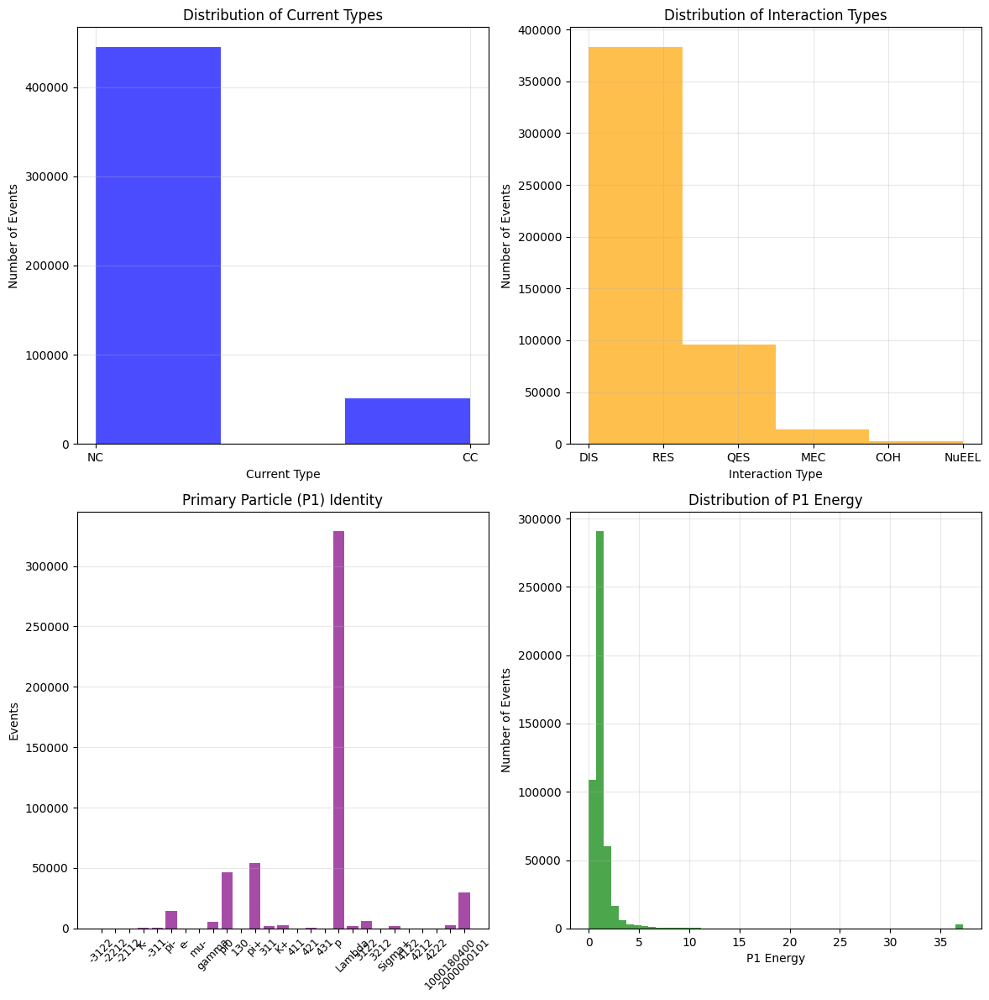

CC percentage: 10.316754850088184
Expected CC percentage: ~3.8%
NC percentage: 89.68324514991181
Expected NC percentage: ~96.2%
CC QES percentage: 23.224054391997498
Expected CC QES percentage: ~51%


In [4]:
df_all = pd.read_csv(output_path_all)
pf.visualize_kg(df_all)
pf.logger_kg(df_all)

## All Data 0.5-30 GeV Stable Taon

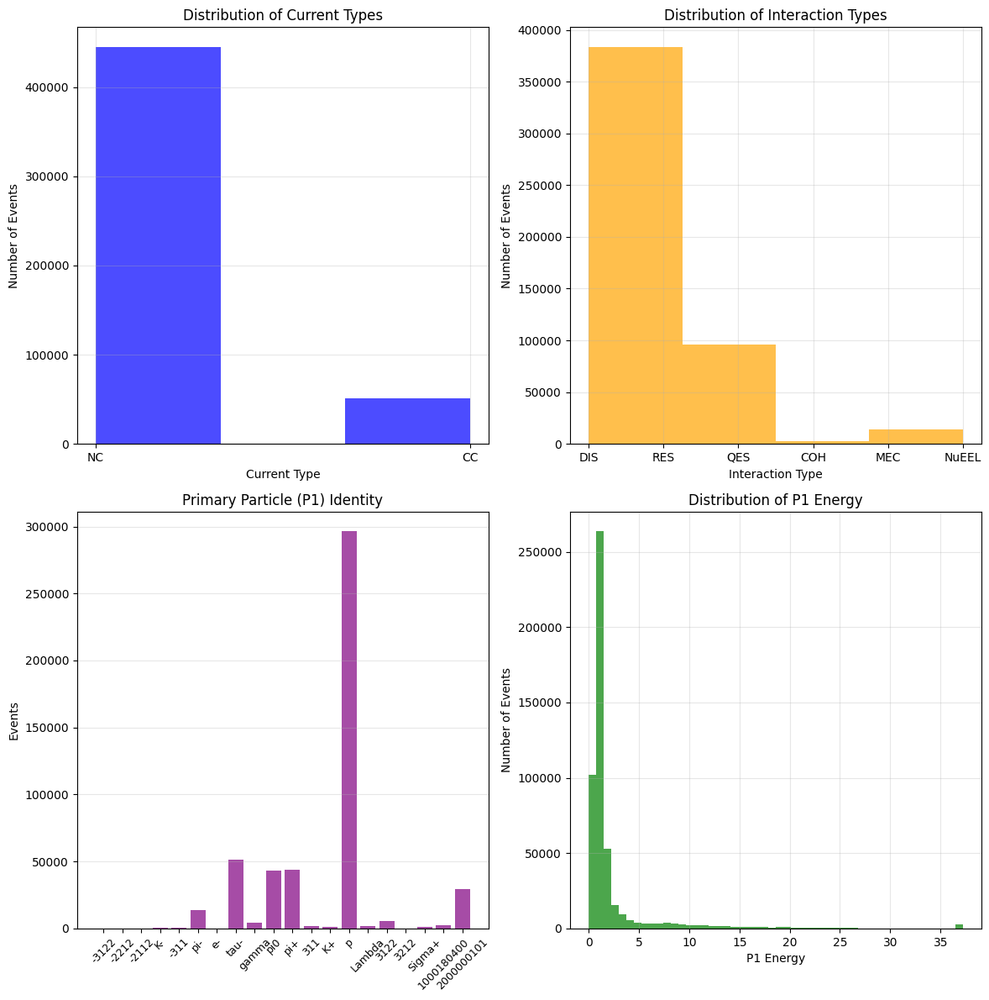

CC percentage: 10.3246246772799
Expected CC percentage: ~3.8%
NC percentage: 89.6753753227201
Expected NC percentage: ~96.2%
CC QES percentage: 23.102600140548137
Expected CC QES percentage: ~51%


In [5]:
df_all_stable = pd.read_csv(output_path_all_stable)
pf.visualize_kg(df_all_stable)
pf.logger_kg(df_all_stable)

In [20]:
df_all_stable.head()

,EvtNum,Nu,CCNC,IntType,Pdg_1,Fchild_1,Lchild_1,px_1,py_1,pz_1,...,py_27,pz_27,E_27,Pdg_28,Fchild_28,Lchild_28,px_28,py_28,pz_28,E_28
0,0,16,NC,DIS,211.0,-1.0,-1.0,-0.269598,-0.010084,0.148691,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,16,NC,RES,211.0,-1.0,-1.0,0.027663,-0.145424,-0.004904,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,16,NC,DIS,111.0,-1.0,-1.0,-0.343324,-0.098178,1.279279,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,16,NC,DIS,2212.0,-1.0,-1.0,0.365709,0.432771,0.244959,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,16,NC,DIS,2212.0,-1.0,-1.0,-0.462810,0.474353,0.919385,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


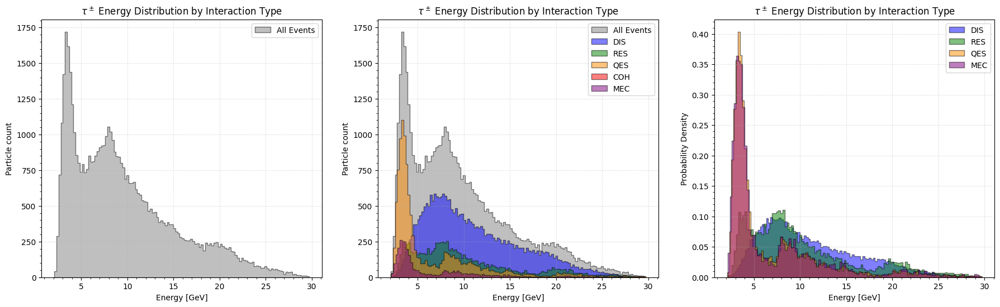

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)
# pf.plot_tau_energy(df_all_stable)
# pf.plot_tau_energy(df_all_stable, QES=True)

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(22, 6))
pf.plot_tau_energy(df_all_stable, ALL=True, ax=ax1, density=False)
pf.plot_tau_energy(df_all_stable, DIS=True, RES=True, QES=True, COH=True, MEC=True, NuEEL=True, ALL=True, ax=ax2, density=False)
pf.plot_tau_energy(df_all_stable, DIS=True, RES=True, QES=True, COH=False, MEC=True, NuEEL=True, ALL=False, ax=ax3, density=True)

plt.show()

# Histrogramy dla próbek wygenerowanych całościowo (0.5-30 GeV) ze stabilnym Taonem
Osobno narysowane mody CC, CC_QES, NC oraz wyeksponowano konkretne cząstki

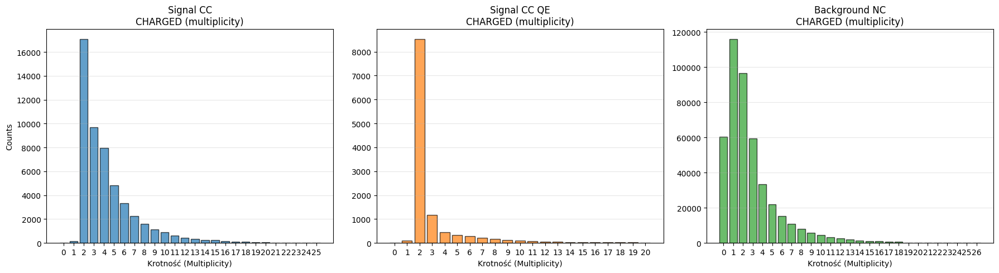

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

df_all_stable_CC = df_all_stable[df_all_stable['CCNC'] == 'CC']
df_all_stable_CC_QES = df_all_stable_CC[df_all_stable_CC['IntType'] == 'QES']
df_all_stable_NC = df_all_stable[df_all_stable['CCNC'] == 'NC']


pf.plot_physics_analysis([df_all_stable_CC, df_all_stable_CC_QES, df_all_stable_NC], 'charged', feature='multiplicity')




# Histrogramy dla próbek wygenerowanych całościowo (0.5-30 GeV) z rozpadającym się Taonem
Osobno narysowane mody CC, CC_QES, NC oraz wyeksponowano konkretne cząstki

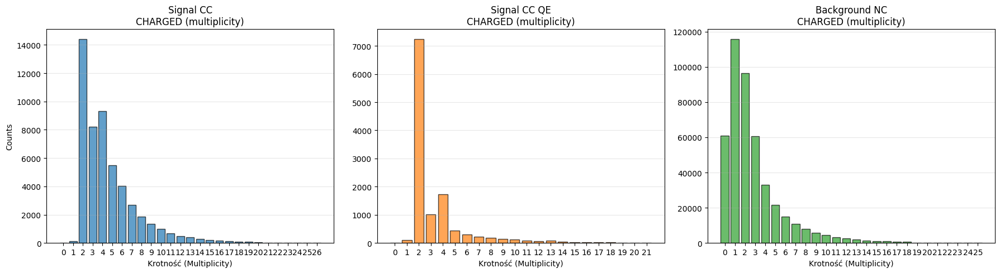

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

df_all_CC = df_all[df_all['CCNC'] == 'CC']
df_all_CC_QES = df_all_CC[df_all_CC['IntType'] == 'QES']
df_all_NC = df_all[df_all['CCNC'] == 'NC']

pf.plot_physics_analysis([df_all_CC, df_all_CC_QES, df_all_NC], 'charged', feature='multiplicity')



# Histrogramy dla próbek wygenerowanych całościowo (0.5-30 GeV)
Osobno narysowane mody CC, CC_QES, NC oraz wyeksponowano konkretne zmienne fizyczne

Stable Tau: Pions


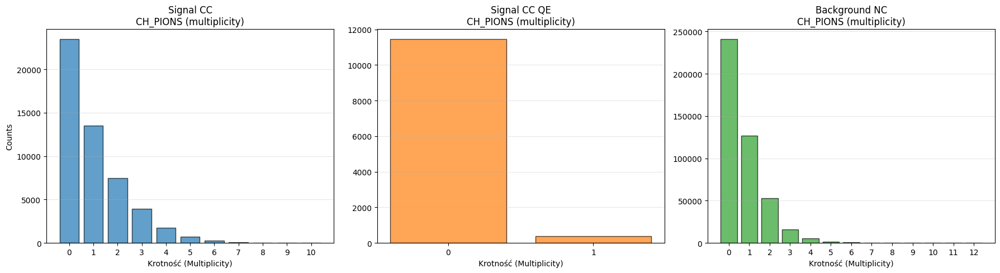

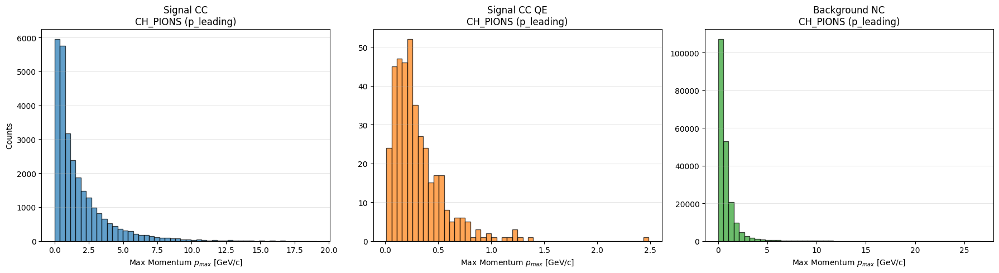

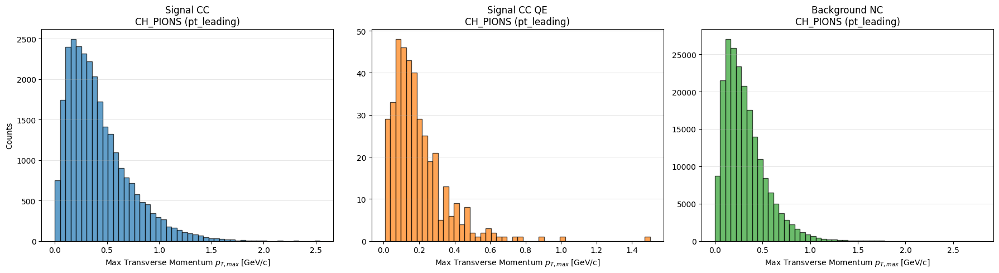

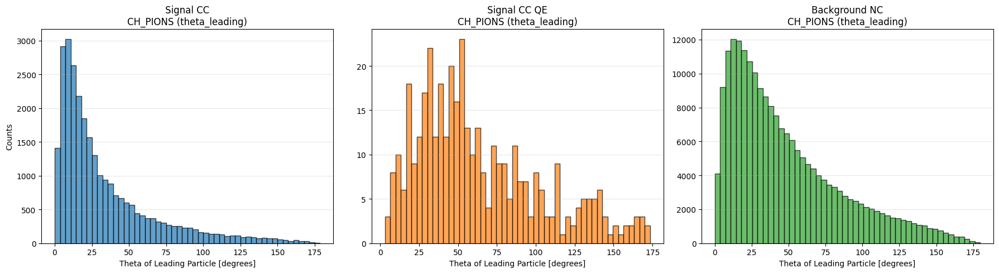

Stable Tau: Neutral Pions


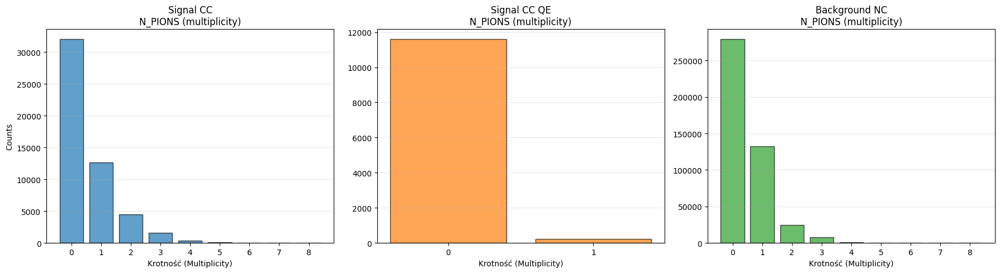

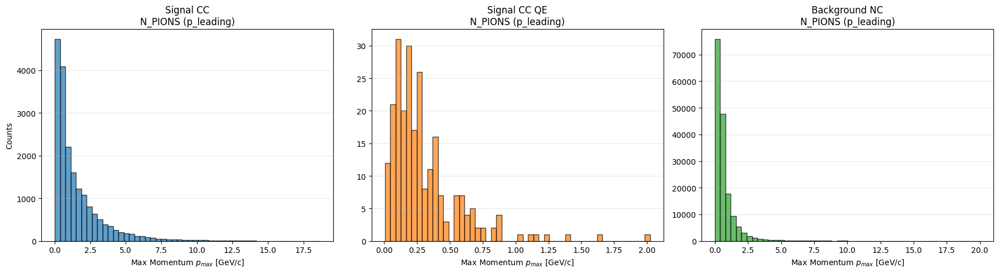

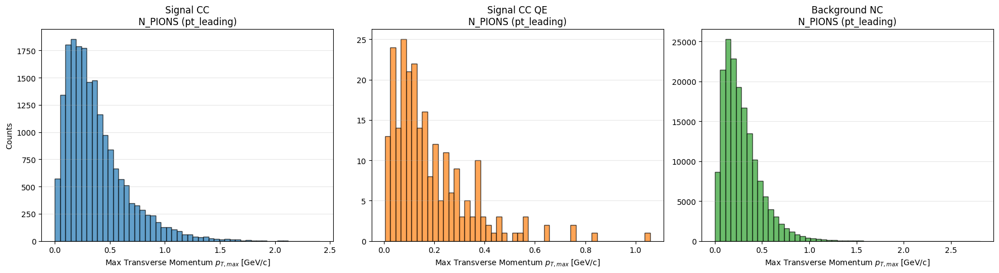

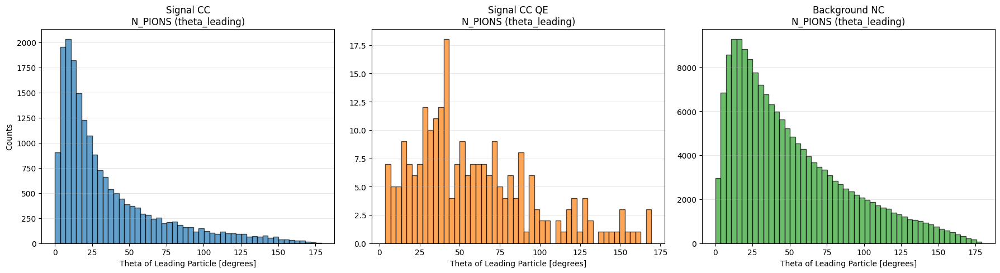

Stable Tau: Protons


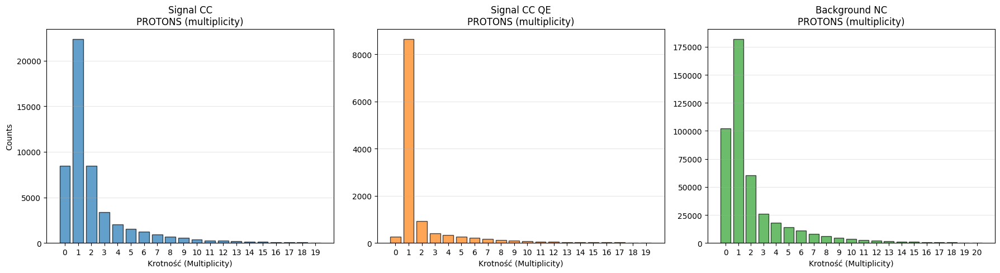

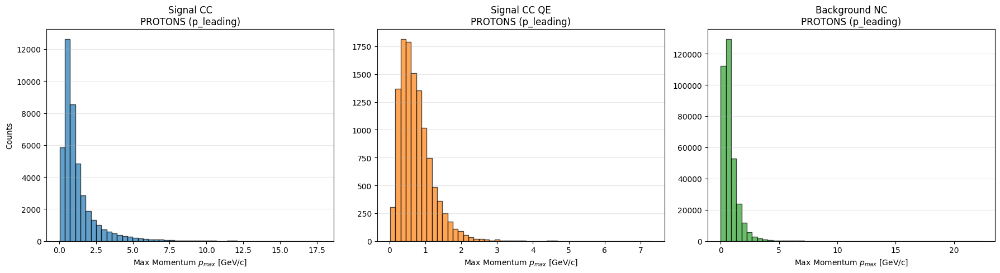

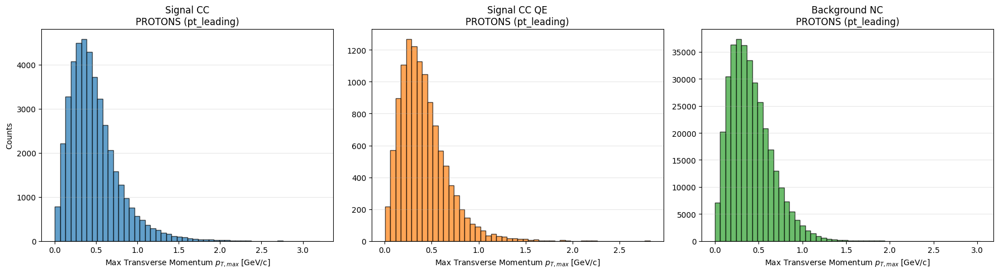

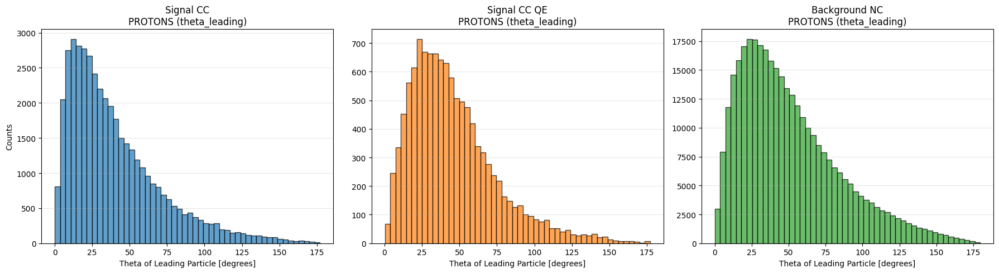

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

DFs_stable = [df_all_stable_CC, df_all_stable_CC_QES, df_all_stable_NC]

print("Stable Tau: Pions")

pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='multiplicity')
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='p_leading')
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='pt_leading')
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='theta_leading')

print("Stable Tau: Neutral Pions")
pf.plot_physics_analysis(DFs_stable, 'n_pions', feature='multiplicity')
pf.plot_physics_analysis(DFs_stable, 'n_pions', feature='p_leading')
pf.plot_physics_analysis(DFs_stable, 'n_pions', feature='pt_leading')
pf.plot_physics_analysis(DFs_stable, 'n_pions', feature='theta_leading')

print("Stable Tau: Protons")
pf.plot_physics_analysis(DFs_stable, 'protons', feature='multiplicity')
pf.plot_physics_analysis(DFs_stable, 'protons', feature='p_leading')
pf.plot_physics_analysis(DFs_stable, 'protons', feature='pt_leading')
pf.plot_physics_analysis(DFs_stable, 'protons', feature='theta_leading')


Unstable Tau: Pions


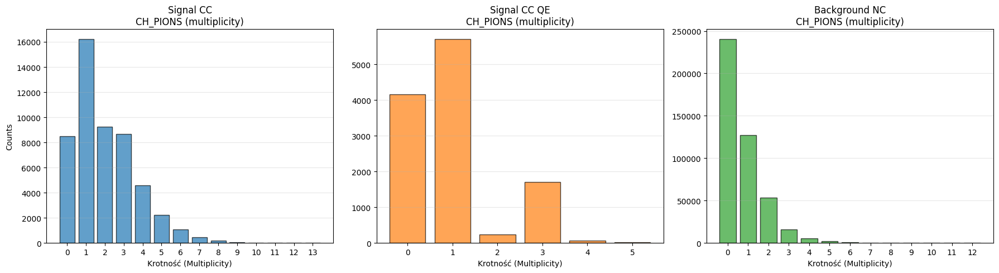

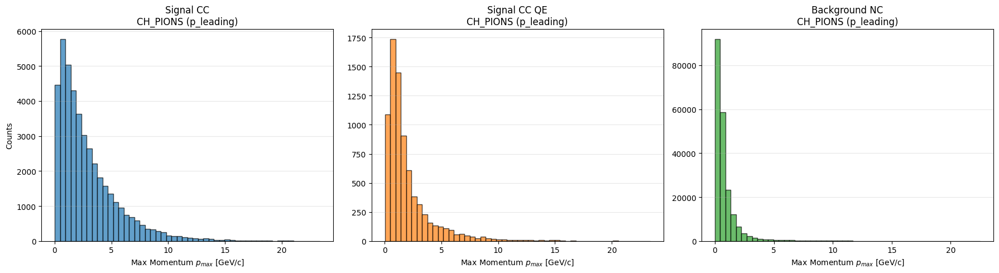

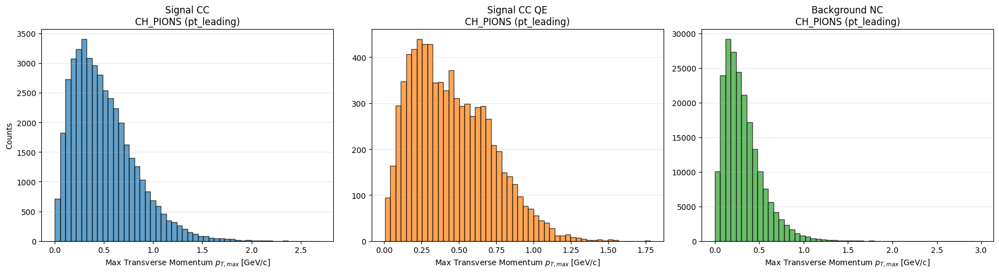

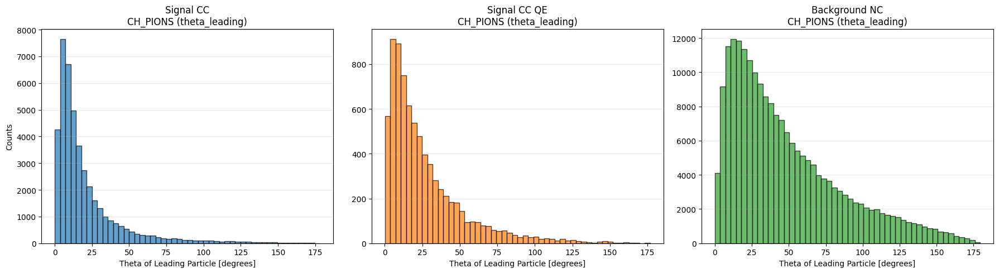

Unstable Tau: Neutral Pions


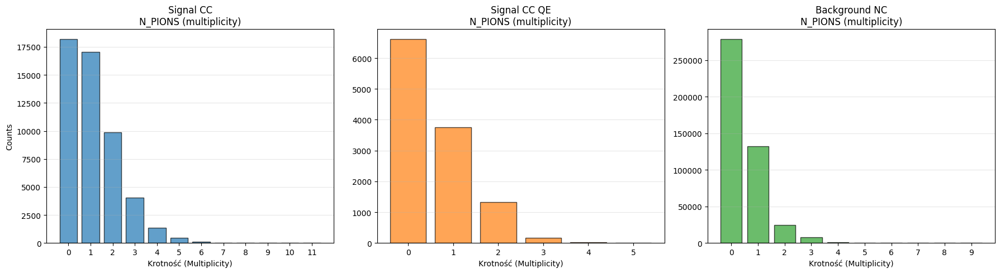

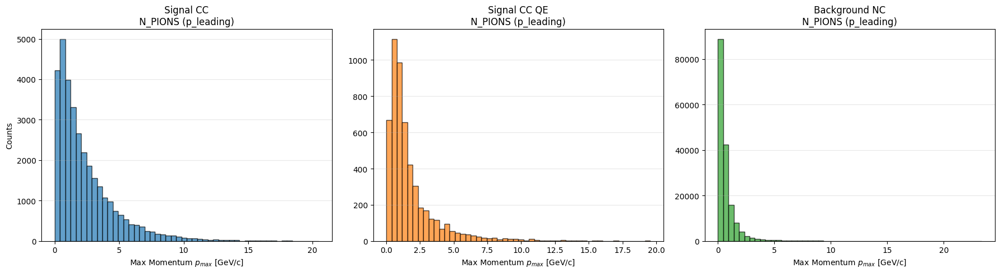

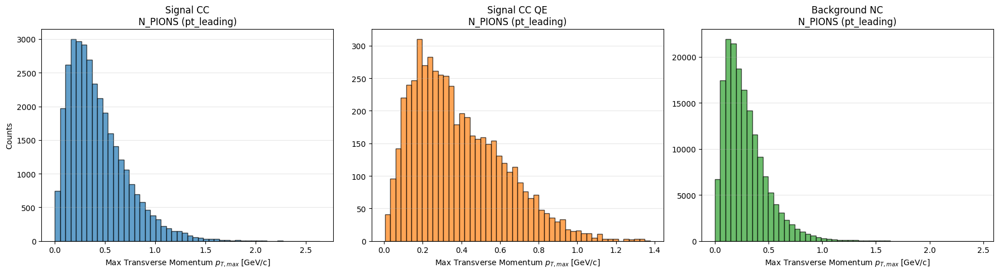

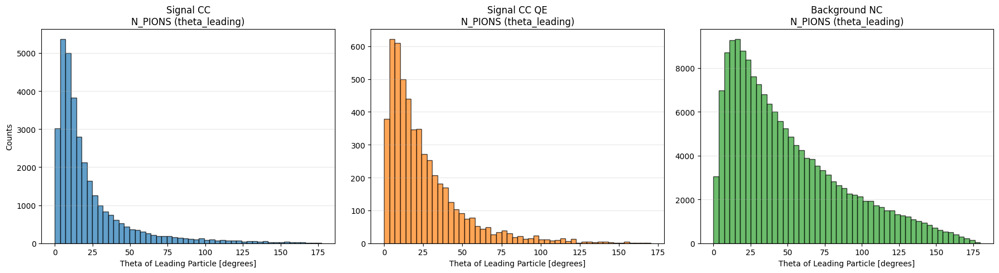

Unstable Tau: Protons


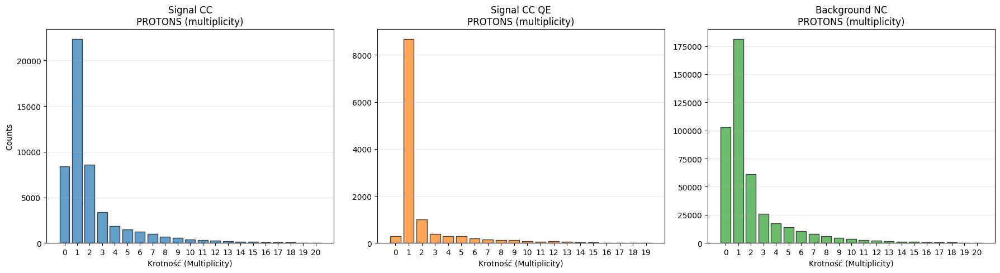

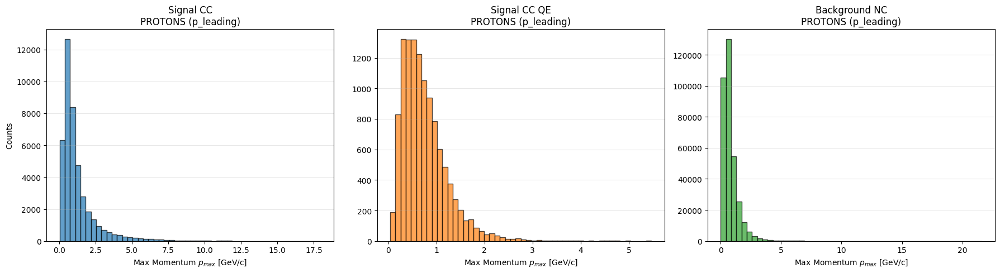

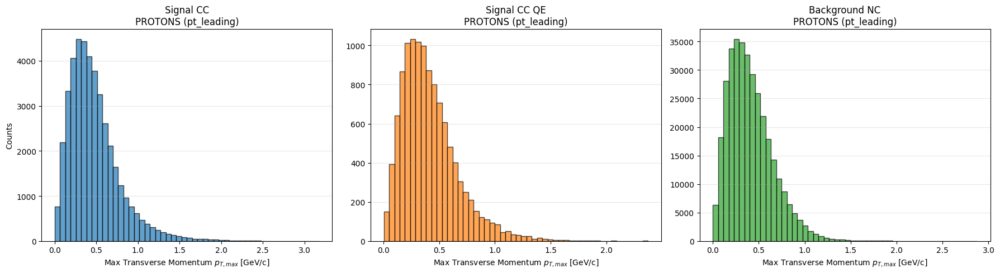

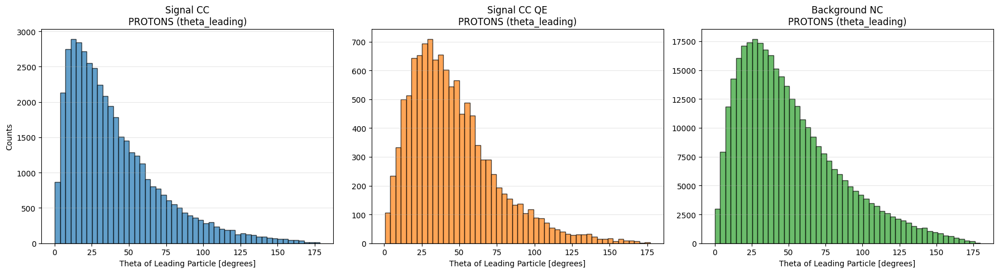

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

DFs_unstable = [df_all_CC, df_all_CC_QES, df_all_NC]

print("Unstable Tau: Pions")
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='multiplicity')
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='p_leading')
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='pt_leading')
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='theta_leading')

print("Unstable Tau: Neutral Pions")
pf.plot_physics_analysis(DFs_unstable, 'n_pions', feature='multiplicity')
pf.plot_physics_analysis(DFs_unstable, 'n_pions', feature='p_leading')
pf.plot_physics_analysis(DFs_unstable, 'n_pions', feature='pt_leading')
pf.plot_physics_analysis(DFs_unstable, 'n_pions', feature='theta_leading')

print("Unstable Tau: Protons")
pf.plot_physics_analysis(DFs_unstable, 'protons', feature='multiplicity')
pf.plot_physics_analysis(DFs_unstable, 'protons', feature='p_leading')
pf.plot_physics_analysis(DFs_unstable, 'protons', feature='pt_leading')
pf.plot_physics_analysis(DFs_unstable, 'protons', feature='theta_leading')


# Rozkład Pędu całkowitego, Pędu poprzecznego oraz Thety dla wszystkich cząstek w All_data (0.5-30 GeV) 

Stable Tau: Pions
Momentum


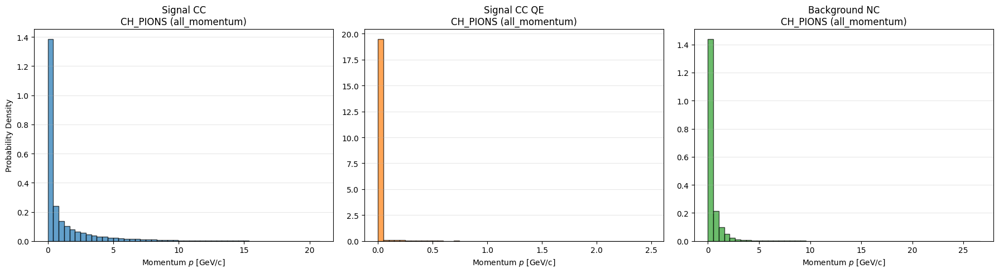

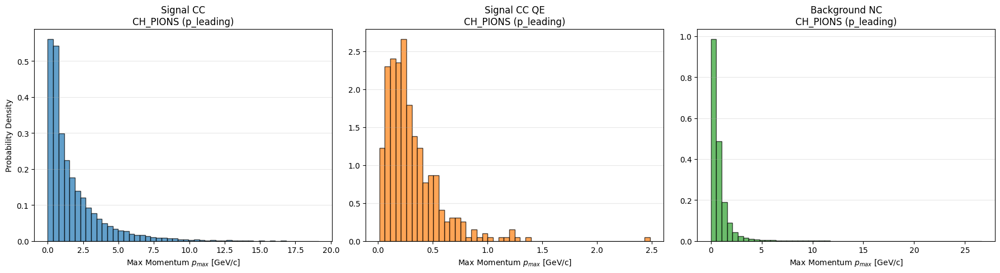

Transverse Momentum


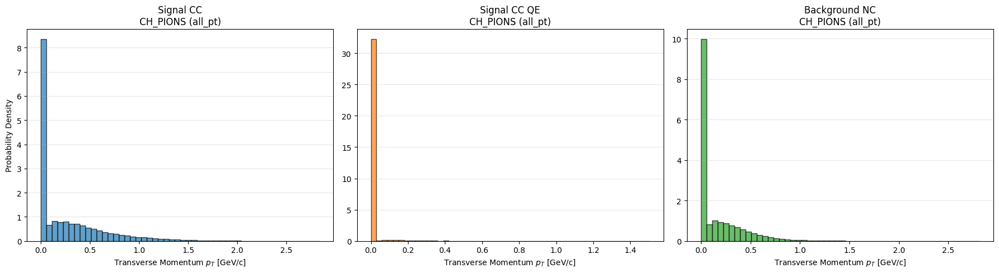

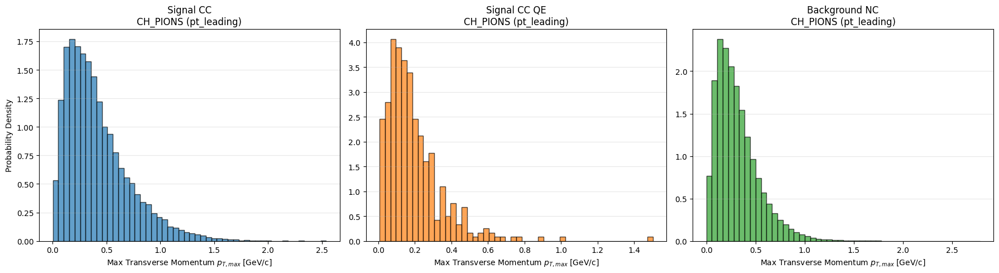

Theta


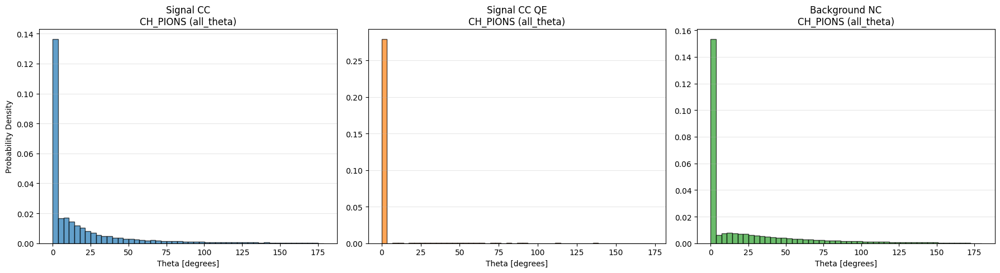

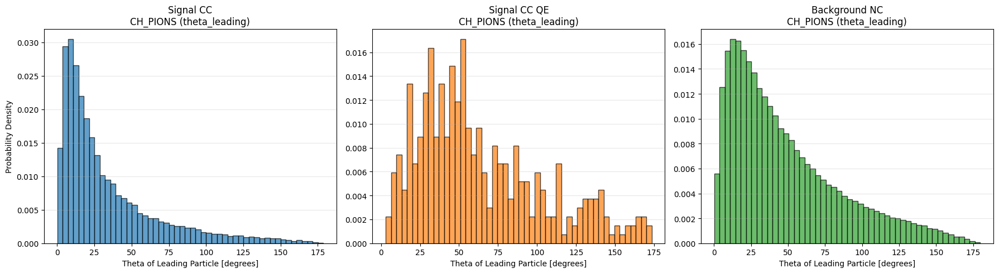

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

DFs_stable = [df_all_stable_CC, df_all_stable_CC_QES, df_all_stable_NC]


print("Stable Tau: Pions")
print("Momentum")
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='all_momentum')
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='p_leading')
print("Transverse Momentum")
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='all_pt')
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='pt_leading')
print("Theta")
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='all_theta')
pf.plot_physics_analysis(DFs_stable, 'ch_pions', feature='theta_leading')




Unstable Tau: Pions
Momentum


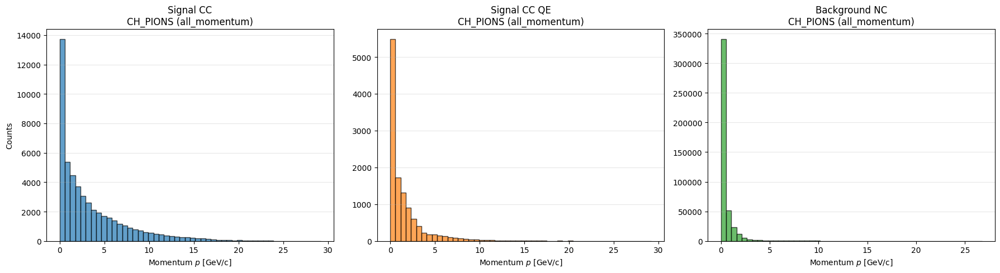

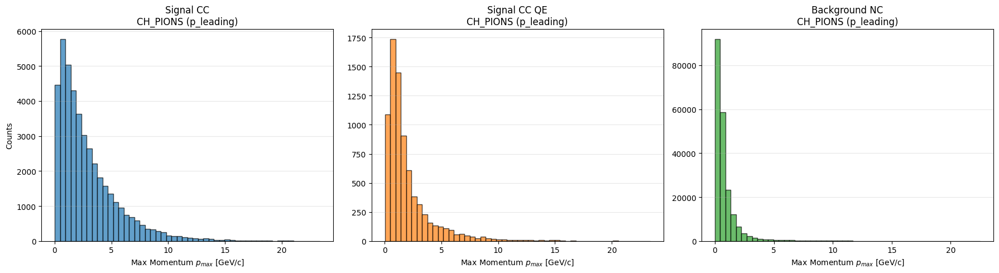

Transverse Momentum


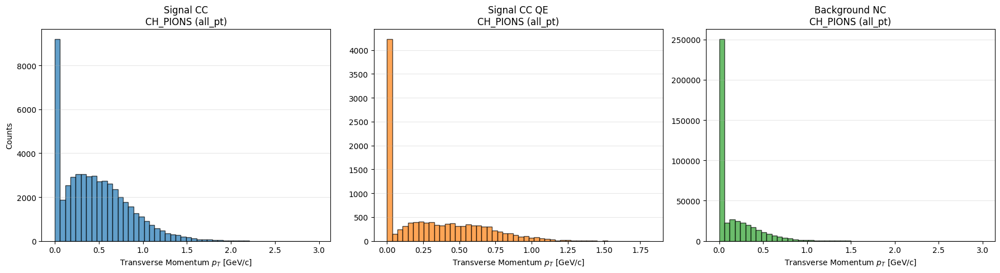

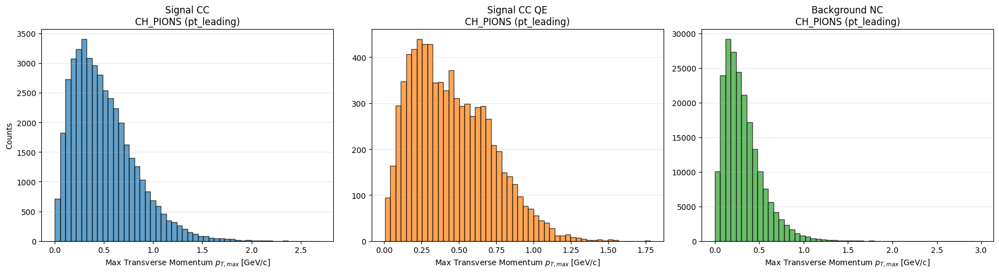

Theta


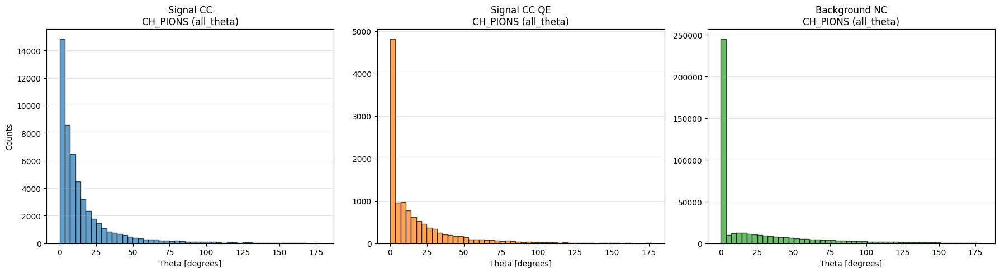

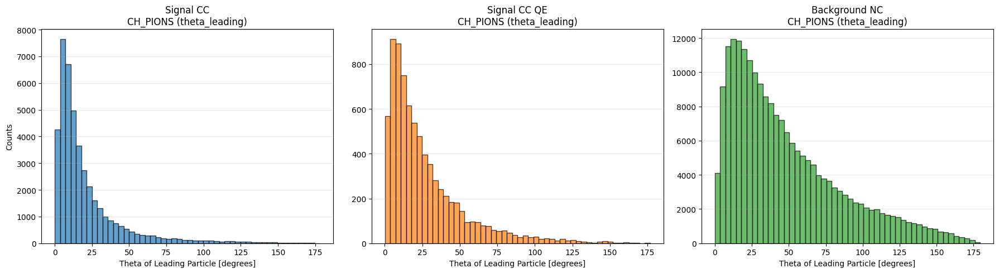

In [ ]:
import analysis.scripts.plotting_functions_dev as pf
importlib.reload(pf)

DFs_unstable = [df_all_CC, df_all_CC_QES, df_all_NC]

print("Unstable Tau: Pions")
print("Momentum")
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='all_momentum')
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='p_leading')
print("Transverse Momentum")
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='all_pt')
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='pt_leading')
print("Theta")
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='all_theta')
pf.plot_physics_analysis(DFs_unstable, 'ch_pions', feature='theta_leading')


## Upgrade

In [3]:
output_dir = 'analysis/processedData'
output_path_all = os.path.join(output_dir, 'data_all_tau.csv')
df_all = pd.read_csv(output_path_all)
df_all.head()

,EvtNum,Nu,CCNC,IntType,Pdg_1,Fchild_1,Lchild_1,px_1,py_1,pz_1,...,py_29,pz_29,E_29,Pdg_30,Fchild_30,Lchild_30,px_30,py_30,pz_30,E_30
0,0,16,NC,DIS,211.0,-1.0,-1.0,-0.269598,-0.010084,0.148691,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,16,NC,RES,211.0,-1.0,-1.0,0.027663,-0.145424,-0.004904,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,16,NC,DIS,111.0,-1.0,-1.0,-0.343324,-0.098178,1.279279,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,16,NC,DIS,2212.0,-1.0,-1.0,0.365709,0.432771,0.244959,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,16,NC,DIS,2212.0,-1.0,-1.0,-0.462810,0.474353,0.919385,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
#features:
# ch pions multiplicity, leading p, leading theta, leading pt - 4
# n pions multiplicity, leading p, leading theta - 3
# charged multiplicity - 1 (this has a potential for even more features, but it will in fact be not exclusively hadronic and have some overlap)

#labels:
# CC vs NC

#metadata:
# intType

In [17]:
import analysis.scripts.preprocess_functions as prf
importlib.reload(prf)

df_pre = prf.get_feature_data(df_all.copy(), ['ch_pions', 'n_pions', 'charged'], feature=['multiplicity', 'p_leading', 'pt_leading', 'theta_leading', 'cos_theta_leading'])
df_pre.head()

,EvtNum,Nu,CCNC,IntType,Pdg_1,Fchild_1,Lchild_1,px_1,py_1,pz_1,...,multiplicity_n_pions,p_leading_n_pions,pt_leading_n_pions,theta_leading_n_pions,cos_theta_leading_n_pions,multiplicity_charged,p_leading_charged,pt_leading_charged,theta_leading_charged,cos_theta_leading_charged
0,0,16,NC,DIS,211.0,-1.0,-1.0,-0.269598,-0.010084,0.148691,...,0,0.000000,NaN,NaN,NaN,3,0.308048,0.269787,61.139026,0.482686
1,1,16,NC,RES,211.0,-1.0,-1.0,0.027663,-0.145424,-0.004904,...,1,0.872583,0.248911,16.574270,0.958451,2,0.250032,0.154980,38.304488,0.784728
2,2,16,NC,DIS,111.0,-1.0,-1.0,-0.343324,-0.098178,1.279279,...,2,1.328181,0.357086,15.596038,0.963181,0,0.000000,NaN,NaN,NaN
3,3,16,NC,DIS,2212.0,-1.0,-1.0,0.365709,0.432771,0.244959,...,1,0.229318,0.103599,26.857219,0.892135,2,0.617283,0.566598,66.619625,0.396834
4,4,16,NC,DIS,2212.0,-1.0,-1.0,-0.462810,0.474353,0.919385,...,0,0.000000,NaN,NaN,NaN,4,1.133346,0.662725,35.785375,0.811213


In [18]:
import analysis.scripts.preprocess_functions as prf
importlib.reload(prf)

df_temp = df_pre.copy()
df_temp = prf.clean_particle_data(df_temp)
df_temp = prf.transform_ccnc(df_temp)
df_temp = prf.fill_nans(df_temp)
print(df_temp['CCNC'].value_counts())
df_temp = prf.filter_int_types(df_temp, ['COH', 'NuEEL'])
print(df_temp['CCNC'].value_counts())

df_clean = df_temp.copy()
df_clean.head()

CCNC
0    444941
1     51184
Name: count, dtype: int64
Removed 2652 rows with IntTypes: ['COH', 'NuEEL']
CCNC
0    442290
1     51183
Name: count, dtype: int64


,EvtNum,CCNC,IntType,multiplicity_ch_pions,p_leading_ch_pions,pt_leading_ch_pions,theta_leading_ch_pions,cos_theta_leading_ch_pions,multiplicity_n_pions,p_leading_n_pions,pt_leading_n_pions,theta_leading_n_pions,cos_theta_leading_n_pions,multiplicity_charged,p_leading_charged,pt_leading_charged,theta_leading_charged,cos_theta_leading_charged
0,0,0,DIS,3,0.308048,0.269787,61.139026,0.482686,0,0.000000,0.000000,0.000000,0.000000,3,0.308048,0.269787,61.139026,0.482686
1,1,0,RES,2,0.250032,0.154980,38.304488,0.784728,1,0.872583,0.248911,16.574270,0.958451,2,0.250032,0.154980,38.304488,0.784728
2,2,0,DIS,0,0.000000,0.000000,0.000000,0.000000,2,1.328181,0.357086,15.596038,0.963181,0,0.000000,0.000000,0.000000,0.000000
3,3,0,DIS,0,0.000000,0.000000,0.000000,0.000000,1,0.229318,0.103599,26.857219,0.892135,2,0.617283,0.566598,66.619625,0.396834
4,4,0,DIS,3,0.876295,0.131575,8.635602,0.988663,0,0.000000,0.000000,0.000000,0.000000,4,1.133346,0.662725,35.785375,0.811213


In [19]:
import analysis.scripts.preprocess_functions as prf
importlib.reload(prf)

df_balanced_train, df_unbalanced_val, df_unbalanced_test = prf.get_physics_informed_split(df_clean, total_train_size=2000, total_val_size=400, total_test_size=400)

Split Complete. Overlap Checks:
  - Train/Val shared events:  0
  - Train/Test shared events: 0
  - Val/Test shared events:   0

[Validation Set Physics Profile]
CC/NC Ratio: {0: 0.9012658227848102, 1: 0.09873417721518987}
Interaction Type Ratios:
IntType
DIS    0.417722
RES    0.362025
QES    0.194937
MEC    0.025316
Name: proportion, dtype: float64

[Testing Set Physics Profile]
CC/NC Ratio: {0: 0.9012658227848102, 1: 0.09873417721518987}
Interaction Type Ratios:
IntType
DIS    0.417722
RES    0.362025
QES    0.194937
MEC    0.025316
Name: proportion, dtype: float64


In [7]:
%pip show seaborn
import seaborn as sns

Name: seaborn
Version: 0.13.2
Summary: Statistical data visualization
Home-page: 
Author: 
Author-email: Michael Waskom <mwaskom@gmail.com>
License: 
Location: /scratch1/gjedrzej/.local/lib/python3.9/site-packages
Requires: matplotlib, numpy, pandas
Required-by: 
Note: you may need to restart the kernel to use updated packages.


In [22]:
# 0 (NC) -> Green, 1 (CC) -> Blue
color_map = {0: (0.1, 0.7, 0.2), 1: (0.1, 0.2, 0.8)}
# Definitive list of all metadata and calculated features
features_list = [
    # 'EvtNum', 
    # 'CCNC', 
    # 'IntType', 
    'multiplicity_ch_pions', 
    'p_leading_ch_pions', 
    'pt_leading_ch_pions', 
    'theta_leading_ch_pions', 
    'cos_theta_leading_ch_pions'
    'multiplicity_n_pions', 
    'p_leading_n_pions', 
    'pt_leading_n_pions', 
    'theta_leading_n_pions', 
    'cos_theta_leading_n_pions',
    'multiplicity_charged', 
    'p_leading_charged', 
    'pt_leading_charged', 
    'theta_leading_charged',
    'cos_theta_leading_charged'
]

features_list_1 = [
    # 'EvtNum', 
    # 'CCNC', 
    # 'IntType', 
    'multiplicity_ch_pions', 
    'p_leading_ch_pions', 
    'pt_leading_ch_pions', 
    'theta_leading_ch_pions', 
    'cos_theta_leading_ch_pions',
    'multiplicity_n_pions', 
    'p_leading_n_pions', 
    'pt_leading_n_pions', 
    'theta_leading_n_pions', 
    'cos_theta_leading_n_pions',
    # 'multiplicity_charged', 
    # 'p_leading_charged', 
    # 'pt_leading_charged', 
    # 'theta_leading_charged'
]
features_list_2 = [
    # 'EvtNum', 
    # 'CCNC', 
    # 'IntType', 
    # 'multiplicity_ch_pions', 
    # 'p_leading_ch_pions', 
    # 'pt_leading_ch_pions', 
    # 'theta_leading_ch_pions', 
    'multiplicity_n_pions', 
    'p_leading_n_pions', 
    'pt_leading_n_pions', 
    'theta_leading_n_pions', 
    'cos_theta_leading_n_pions',
    'multiplicity_charged', 
    'p_leading_charged', 
    'pt_leading_charged', 
    'theta_leading_charged',
    'cos_theta_leading_charged'
]
features_list_3 = [
    # 'EvtNum', 
    # 'CCNC', 
    # 'IntType', 
    'multiplicity_ch_pions', 
    'p_leading_ch_pions', 
    'pt_leading_ch_pions', 
    'theta_leading_ch_pions', 
    'cos_theta_leading_ch_pions',
    # 'multiplicity_n_pions', 
    # 'p_leading_n_pions', 
    # 'pt_leading_n_pions', 
    # 'theta_leading_n_pions', 
    'multiplicity_charged', 
    'p_leading_charged', 
    'pt_leading_charged', 
    'theta_leading_charged',
    'cos_theta_leading_charged'
]


In [ ]:
# graph = sns.PairGrid(df_balanced_train, hue="CCNC", vars=features_list, palette=color_map)
# graph.map_diag(sns.histplot)
# graph.map_offdiag(sns.scatterplot);
# graph.add_legend();

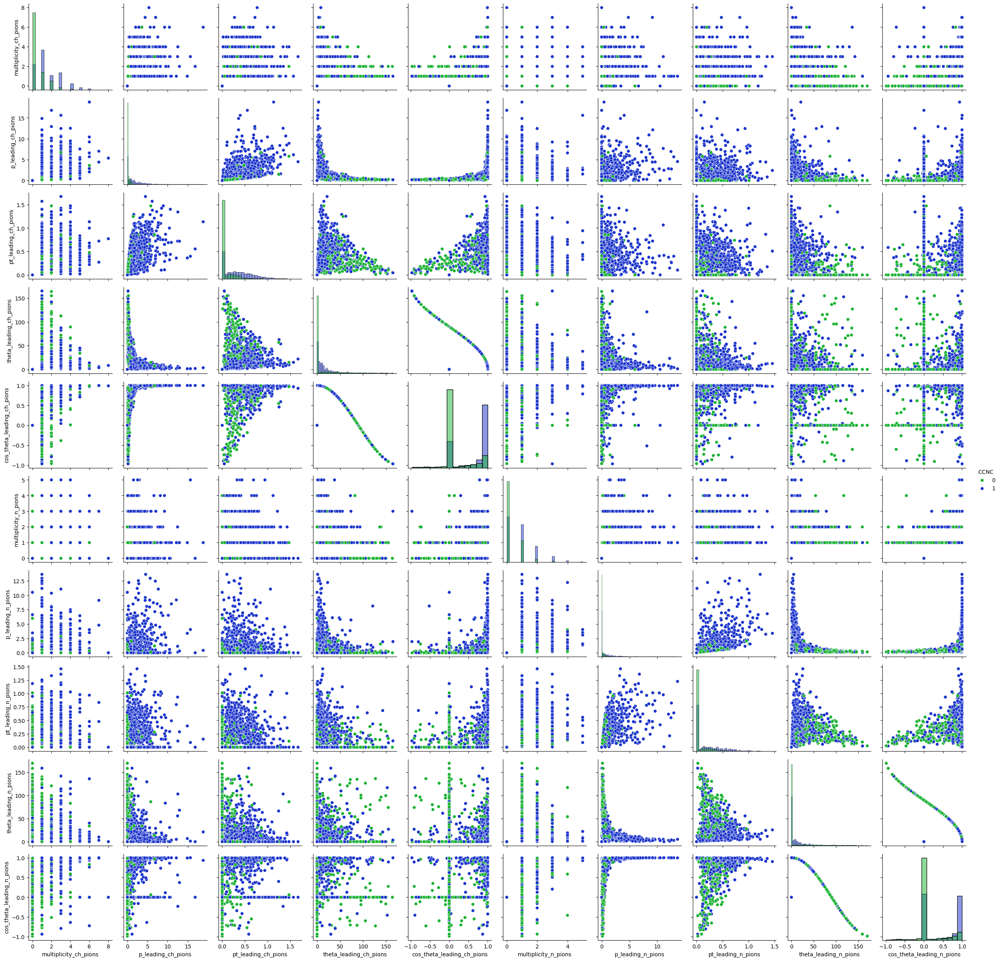

In [23]:
graph = sns.PairGrid(df_balanced_train, hue="CCNC", vars=features_list_1, palette=color_map)
graph.map_diag(sns.histplot)
graph.map_offdiag(sns.scatterplot);
graph.add_legend();

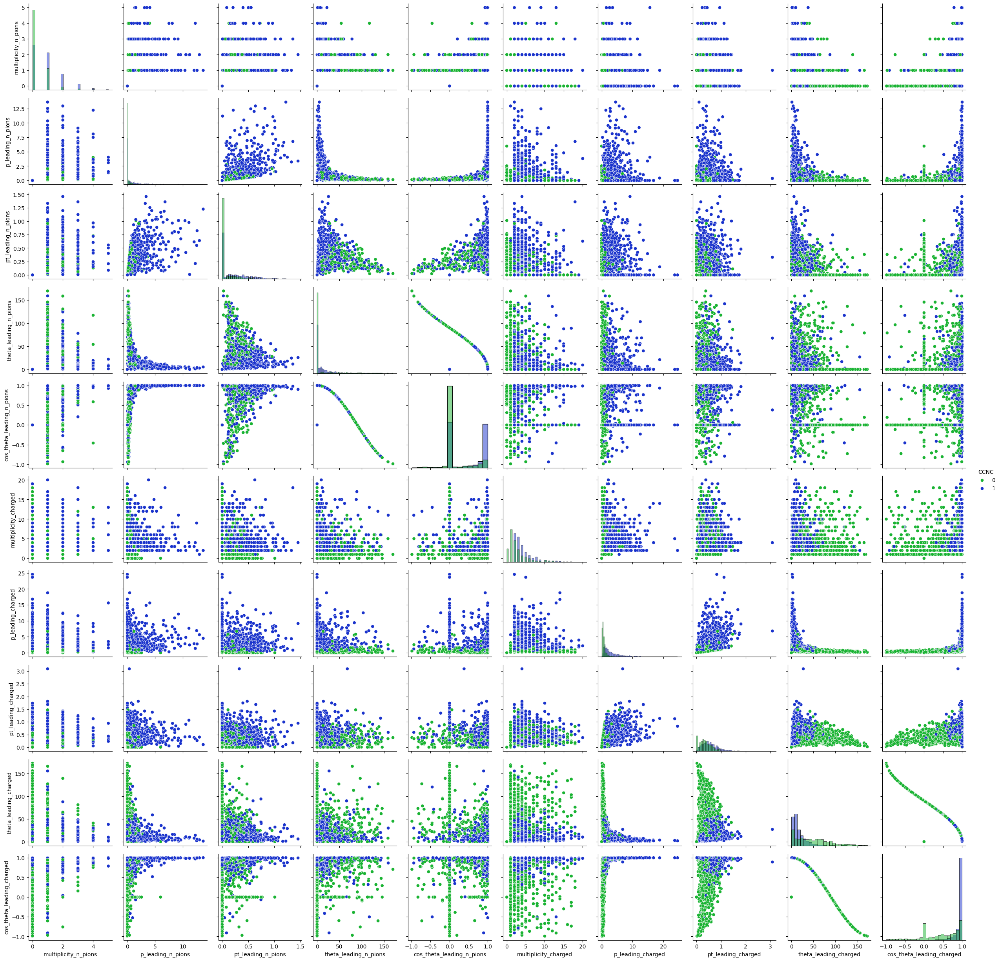

In [24]:
graph = sns.PairGrid(df_balanced_train, hue="CCNC", vars=features_list_2, palette=color_map)
graph.map_diag(sns.histplot)
graph.map_offdiag(sns.scatterplot);
graph.add_legend();

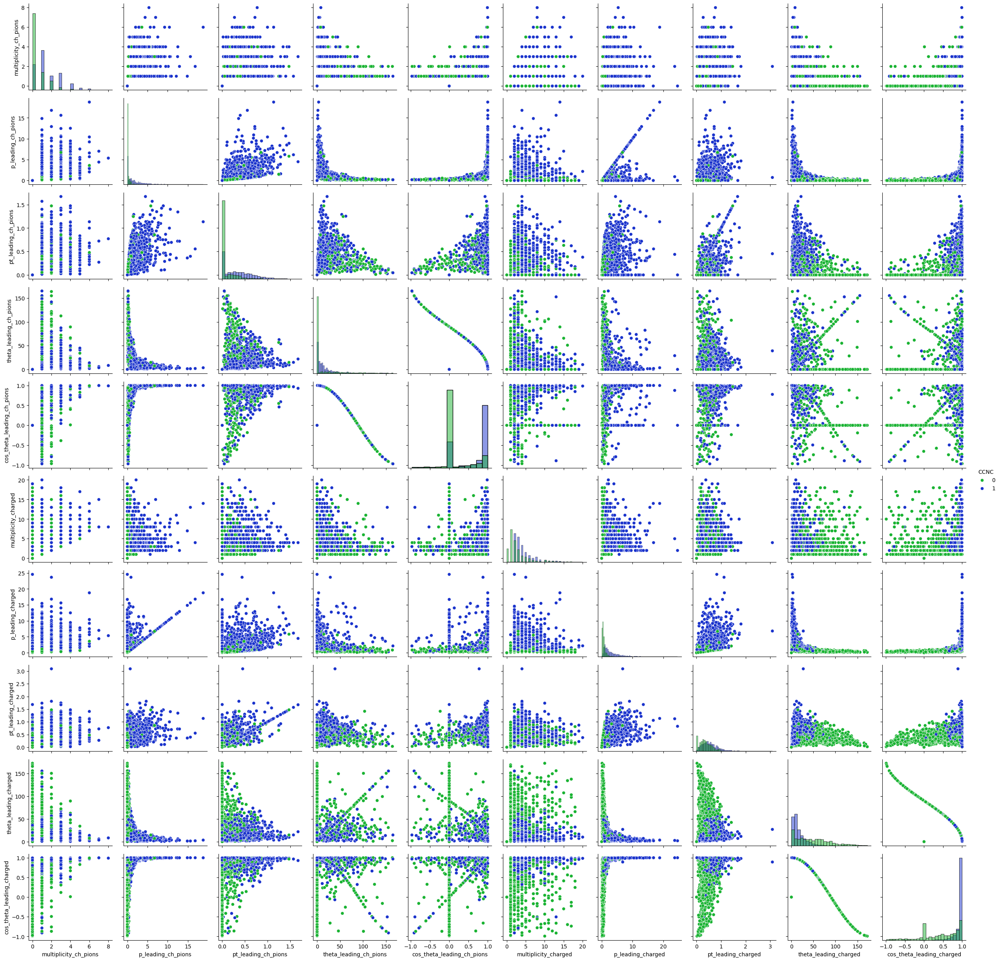

In [25]:
graph = sns.PairGrid(df_balanced_train, hue="CCNC", vars=features_list_3, palette=color_map)
graph.map_diag(sns.histplot)
graph.map_offdiag(sns.scatterplot);
graph.add_legend();

In [ ]:
# best plots: (ch th lead, ch pt lead), (ch th lead, ch p lead), (ch th lead, ch multiplicity), , (ch th lead, n_pi p lead),


#charged: multiplicity, p_leading, pt_leading, cos_theta_leading, 
#ch_pion: multiplicity, p_leading, pt_leading, cos_theta_leading
#n_pion: multiplicity, p_leading, pt_leading, cos_theta_leading

# cos(theta)>theta


In [ ]:
    feature_matrix = np.column_stack([
        np.nan_to_num(ch_lead_pt),
        np.nan_to_num(ch_lead_p),
        np.nan_to_num(ch_lead_cos_theta),
        ch_pion_mult,
        ch_charged_mult,
        n_pion_mult,
        np.nan_to_num(n_lead_cos_theta),
        np.nan_to_num(n_lead_p)
        
    ]).astype(np.float32)